In [1]:
import tensorflow as tf
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl

import numpy as np
## python 의 image 처리 Library 사용 (PIL)
import PIL.Image

import os
import time
import functools

In [2]:
tf.config.experimental_run_functions_eagerly(True)

Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.


In [3]:
mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

In [4]:
## tensor 를 입력받아 image로 변환해주는 함수

def tensor_to_image(tensor):
  tensor = tensor*255
  ## dtype : unit8 = 양수만 표현 가능, 2^8 개만큼 표현 가능(0~255)
  tensor = np.array(tensor, dtype=np.uint8)
  ## np.ndim : np array 의 차원수를 돌려줌
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    ## 4차원으로 변환된 행렬을 3차원으로 바꿔준다.
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor) ## PIL의 image.fromarray method 로 배열을 이미지로 변환

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:

## google drive 에 업로드한 사진을 content_path와 style_path 에 1개씩 넣어준다.

content_path = '/content/drive/MyDrive/styles/tubingen.jpg'

style_path = '/content/drive/MyDrive/styles/composition_vii.jpg'



In [7]:
## 이미지를 텐서타입으로 변환하여 반환한다.

def load_img(path_to_img):
  max_dim = 512
  ## 1) 이미지를 tensor 타입으로 불러오기
  img = tf.io.read_file(path_to_img)
  ## 2) 3채널로 디코딩
  img = tf.image.decode_image(img, channels=3)
  ## 3) data type 을 float 으로 변환
  img = tf.image.convert_image_dtype(img, tf.float32)
  ## image 의 shape 를 따옴
  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  ## 해당 이미지에서 가장 큰 차원의 값을 위에서 선언한 max_size 인 512로 해주고, 나머지 값은 그에 비례해 변환
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)
  ## image 를 전처리한 size로 resize 해준다.(채널수는 안바뀜)
  img = tf.image.resize(img, new_shape)
  ## image 를 3차원에서 4차원으로 변형시킨다. (tf.newaxis.) => 아래코드에서는 0번 위치에 추가함
  img = img[tf.newaxis, :]
  return img 

In [8]:
## 텐서타입의 image data를 plot 한다.

def imshow(images):
  ## 입력값이 4차원 이상일 경우 
  for i in range(3):
    if len(images[i].shape) > 3:
      images[i] = tf.squeeze(images[i], axis=0)

  titles = ['Content', 'Style', 'Transfered']

  for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

In [ ]:
## 지정경로에서 로드한 이미지를 변수에 할당 (모두 tensor 형식임)
'''
content_image = load_img(content_path)
style_image = load_img(style_path)
'''

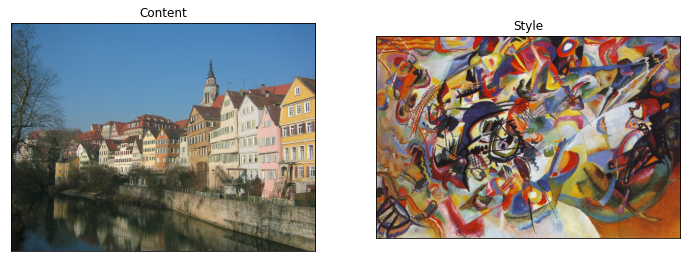

In [ ]:
'''
imshow(content_image, style_image)
'''

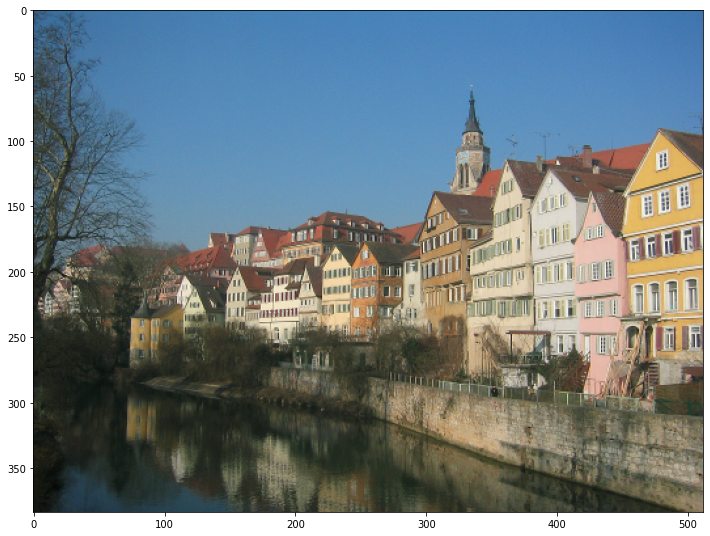

In [ ]:
'''
imshow(content_image)
'''

2. Model 구성하기

In [18]:
## 2-1) 전이모델의 base 모델로 사용할 VGG19를 불러온다.


## image net 을 미리 학습한 가중치를 가지고 있음
## 해당 layer 들의 가중치는 학습을 반영하지 않는다.
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
vgg.trainable = False

## vgg 모델에 있는 layer 들의 이름을 따로 뽑습니다.
layer_names = {}
for i, layer in enumerate(vgg.layers):
  layer_names[i] = layer.name



In [ ]:
## content 층과 style 층을 담당할 Layer 들을 정해줍니다.
## 다만, 논문을 참고해 style layer를 5개로 하고, content layer를 1개로 하여 
## content image(변환시킬 이미지)는 덜 변형시키는 방향으로 한다.

'''
content_layers_no = 18
style_layers_no = (1, 4, 7, 12, 17)
'''

In [ ]:
'''
content_layers = [layer_names[content_layers_no]]
style_layers = []
for i in style_layers_no:
  style_layers.append(layer_names[i])

'''

In [ ]:
'''
print(content_layers)
print(style_layers)
'''

['block5_conv2']
['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']


In [9]:
## 중간층의 출력값 (=feature map)을 반환하는 모델을 만든다.

def vgg_layers(layer_names):  
  outputs = [vgg.get_layer(name).output for name in layer_names]
  model = tf.keras.Model([vgg.input], outputs)
  return model

* Gram - Matrix 계산식

$$G^l_{cd} = \frac{\sum_{ij} F^l_{ijc}(x)F^l_{ijd}(x)}{IJ}$$

In [10]:
## 2-2) Gram Matrix 를 반환하는 함수를 만든다.

## gram matrix 는 각 Feature map 사이의 상관관계를 담고 있음
## 각 위치에서 feature vector 끼리 외적을 구한후 평균을 구하기 때문임

def gram_matrix(input_tensor):
  ## 위에 나온 Gram matrix 구하는 공식을 tensorflow 에서 제공하는 einsum으로 쉽게 구현할수 있다.
  ## 분자 분모 모두 그대로 구현함
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [11]:
## 2-3) 
## 입력된 image 의 content_layer 에서의 출력값과 , style_layer에서의 출력값을 반환함
## 다만 Gram matrix 의 적용은 style-layer에서만 시행한다.
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg =  vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    inputs = inputs*255.0
    ## vgg19 모델으 preprocess 를 사용한다.
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    ## style ~ content layer 를 모두 거쳐 나온 결과물
    outputs = self.vgg(preprocessed_input)
    ## style layer 의 결과와 content layer 의 결과를 나눠줌
    style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                      outputs[self.num_style_layers:])

    ## style layer 의 결과에는 gram_matrix 를 적용한다. (상관관계)
    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]
    ## content layer 는 결과 그대로 사용한다.
    content_dict = {content_name:value 
                    for content_name, value 
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}
    
    return {'content':content_dict, 'style':style_dict}



In [ ]:
'''
extractor = StyleContentModel(style_layers, content_layers)
'''

3. Style Transfer Algorithm 구성

In [ ]:
## 3-1) style 과 content 의 각 target 값을 정해준다.
'''
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']
'''

In [ ]:
## 3-2) content_image 를 변화시킬때 마다 저장해줄 변수를 선언한다. (우선은 원본 이미지를 넣어둠)
'''
image = tf.Variable(content_image)
'''

In [12]:
## 이미지의 pixel 값이 0과 1사이에 있도록 clipping 해주는 함수

def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [ ]:
## 논문에서는 LBFGS 를 옵티마이저로써 사용했지만, tensorflow는 지원하지 않고
## scipy를 로드해야하는데, small project 이므로 그냥 adam을 사용하는 것으로 한다.

'''
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
'''

In [ ]:
## 각 Loss 값에 곱해줄 가중치를 설정해준다.
'''
style_weight=1e-2
content_weight=1e4
'''

In [ ]:
'''
num_style_layers = len(style_layers)
num_content_layers = len(content_layers)
'''

In [13]:
## Style layer 와 content layer 에서의 loss 를 구하는 함수

def style_content_loss(outputs, style_targets, content_targets, num_style_layers, num_content_layers):
    style_targets = style_targets
    content_targets = content_targets
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

4. Total Variation Loss (총변위손실)

* 연구 결과 High Frequency artifact 문제가 있다고 함
* 아티팩트 : 이미지 전환 과정에서 만들어지는 화상의 결함
* 이를 완화해주기위해 regularization 을 추가해주었다고 함
* 이 값을 Total Variation Loss 라고 정의하였음

* 편리하게도 Tensorflow 에서는 Total Variation Loss를 구해주는 method 가 있음 = tf.image.total_vairation(image)

5. Train 함수 작성 및 최적화

In [ ]:
'''
total_variation_weight=30
'''

In [14]:
## 5-1) Train 함수

@tf.function()
def train_step(image, style_targets, content_targets, extractor, num_style_layers, num_content_layers):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs, style_targets, content_targets, num_style_layers, num_content_layers)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

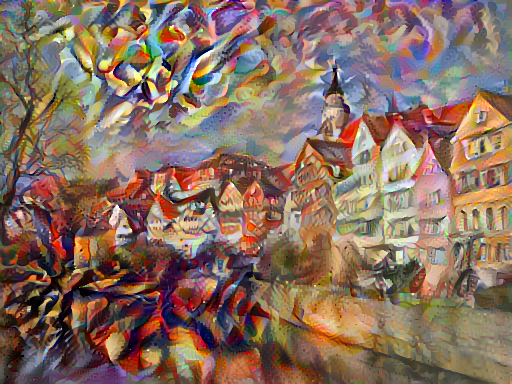

훈련 스텝: 1000
전체 소요 시간: 37.1


In [ ]:

'''
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("훈련 스텝: {}".format(step))

end = time.time()
print("전체 소요 시간: {:.1f}".format(end-start))
'''

In [15]:
## 전역변수 성격들을 미리 선언해준다.
total_variation_weight= 30
style_weight=1e-2
content_weight=1e4

opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [16]:

def myTransfer(content_path, style_path, content_layers_no, style_layers_no):
  
  content_path = content_path
  style_path = style_path
  content_layers_no = content_layers_no
  style_layers_no = style_layers_no

  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

  layer_names = {}
  for i, layer in enumerate(vgg.layers):
    layer_names[i] = layer.name

  content_image = load_img(content_path)
  style_image = load_img(style_path)

  content_layers = [layer_names[content_layers_no]]
  style_layers = []
  for i in style_layers_no:
    style_layers.append(layer_names[i])

  num_style_layers = len(style_layers)
  num_content_layers = len(content_layers)

  extractor = StyleContentModel(style_layers, content_layers)

  style_targets = extractor(style_image)['style']
  content_targets = extractor(content_image)['content']

  image = tf.Variable(content_image)

  start = time.time()

  epochs = 10
  steps_per_epoch = 100

  step = 0
  for n in range(epochs):
    for m in range(steps_per_epoch):
      step += 1
      train_step(image,  style_targets, content_targets, extractor, num_style_layers, num_content_layers)
      print(".", end='')
    display.clear_output(wait=True)
    display.display(tensor_to_image(image))
    print("훈련 스텝: {}".format(step))

  end = time.time()
  print("전체 소요 시간: {:.1f}".format(end-start))

  return content_image, style_image, image

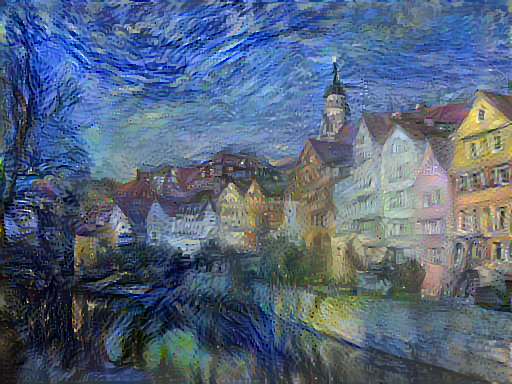

훈련 스텝: 1000
전체 소요 시간: 83.3


In [19]:
params1 = {
    ## 튀빙겐 : 독일의 도시
    'content_path' : '/content/drive/MyDrive/styles/tubingen.jpg',
    ## "별이 빛나는 밤" : 반고흐 (후기 인상주의)
    'style_path' : '/content/drive/MyDrive/styles/starry_night.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params1)

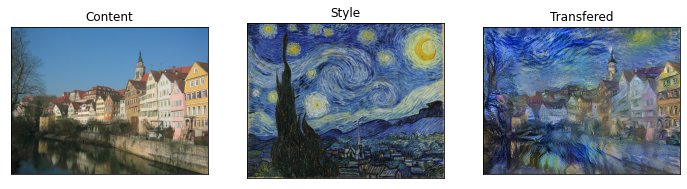

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

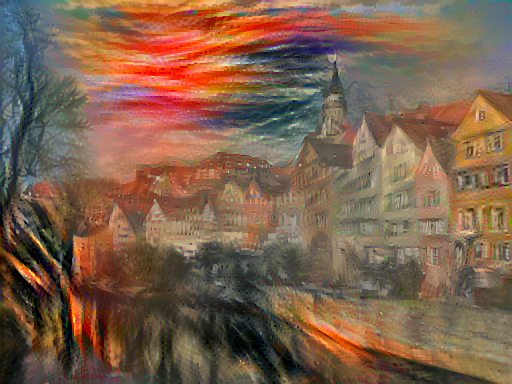

훈련 스텝: 1000
전체 소요 시간: 123.6


In [ ]:
params1 = {
    ## 튀빙겐 : 독일의 도시
    'content_path' : '/content/drive/MyDrive/styles/tubingen.jpg',
    ## "절규" : 뭉크 (표현 주의)
    'style_path' : '/content/drive/MyDrive/styles/the_scream.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params1)

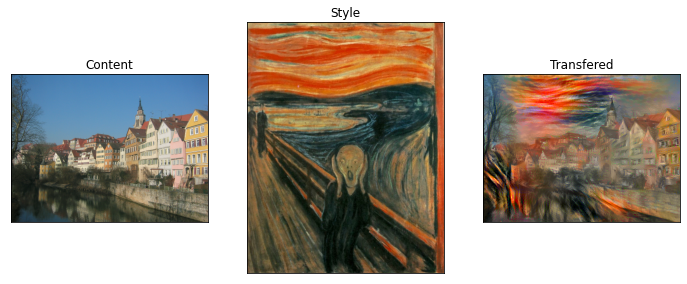

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

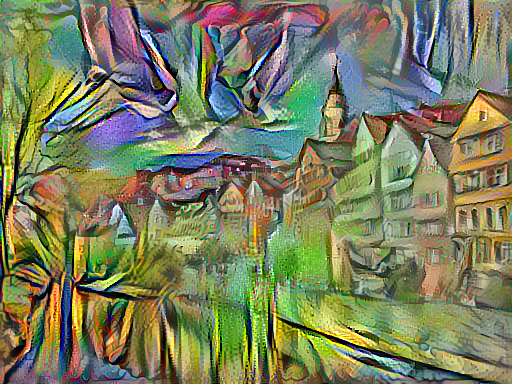

훈련 스텝: 1000
전체 소요 시간: 122.9


In [ ]:
params1 = {
    ## 튀빙겐 : 독일의 도시
    'content_path' : '/content/drive/MyDrive/styles/tubingen.jpg',
    ## "뮤즈" : 피카소 (입체파)
    'style_path' : '/content/drive/MyDrive/styles/muse.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params1)

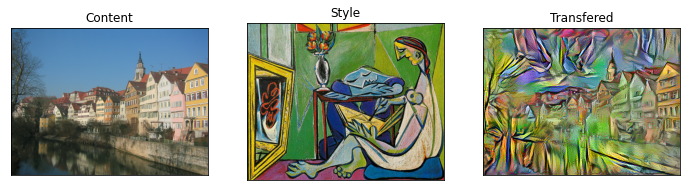

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

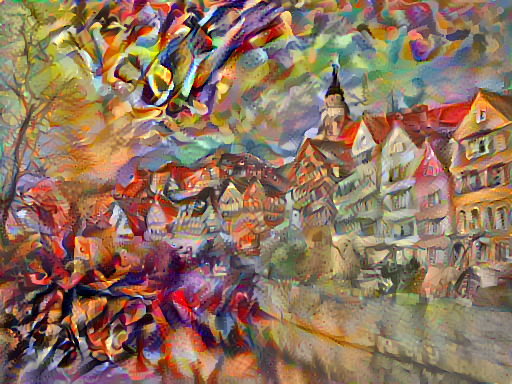

훈련 스텝: 1000
전체 소요 시간: 123.4


In [ ]:
params1 = {
    ## 튀빙겐 : 독일의 도시
    'content_path' : '/content/drive/MyDrive/styles/tubingen.jpg',
    ## "구성 vii" : 칸딘스키 (표현주의, 추상주의)
    'style_path' : '/content/drive/MyDrive/styles/composition_vii.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params1)

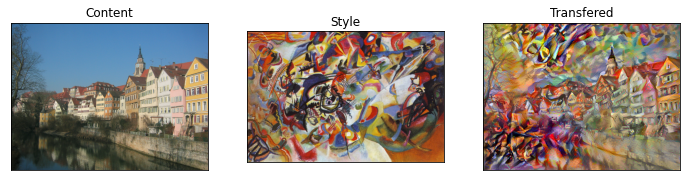

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

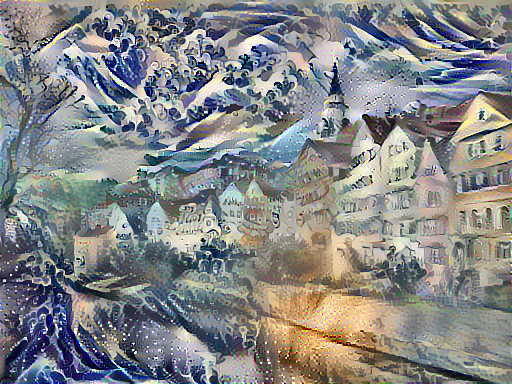

훈련 스텝: 1000
전체 소요 시간: 123.4


In [ ]:
params1 = {
    ## 튀빙겐 : 독일의 도시
    'content_path' : '/content/drive/MyDrive/styles/tubingen.jpg',
    ## "카나가와 해변의 높은 파도 아래" : 호쿠사이 (우키요에)
    'style_path' : '/content/drive/MyDrive/styles/The_Great_Wave_off_Kanagawa.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params1)

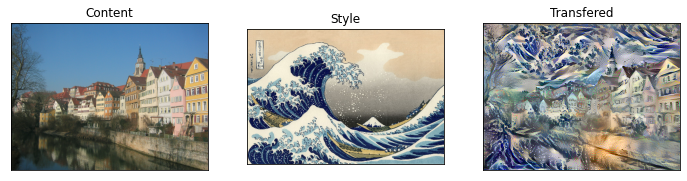

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

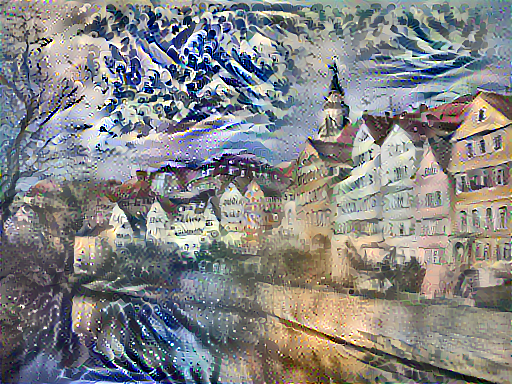

훈련 스텝: 1000
전체 소요 시간: 124.0


In [ ]:
params2 = {
    ## 튀빙겐 : 독일의 도시
    'content_path' : '/content/drive/MyDrive/styles/tubingen.jpg',
    ## "카나가와 해변의 높은 파도 아래" : 호쿠사이 (우키요에)
    'style_path' : '/content/drive/MyDrive/styles/The_Great_Wave_off_Kanagawa.jpg', 
    'content_layers_no' : 17,
    'style_layers_no' : (1, 4, 7, 12, 18),
    
}

content_image, style_image, transfered_image = myTransfer(**params2)

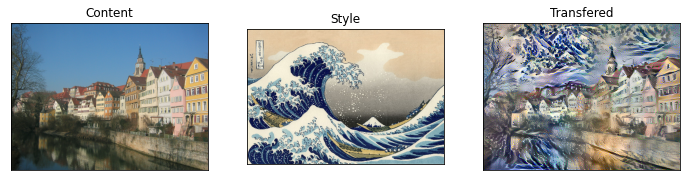

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

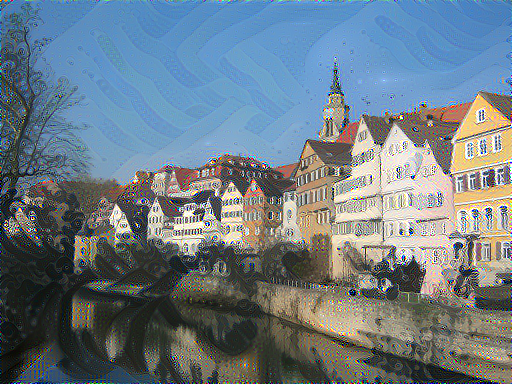

훈련 스텝: 1000
전체 소요 시간: 121.3


In [ ]:
params3 = {
    ## 튀빙겐 : 독일의 도시
    'content_path' : '/content/drive/MyDrive/styles/tubingen.jpg',
    ## "카나가와 해변의 높은 파도 아래" : 호쿠사이 (우키요에)
    'style_path' : '/content/drive/MyDrive/styles/The_Great_Wave_off_Kanagawa.jpg', 
    'content_layers_no' : 4,
    'style_layers_no' : (1, 5, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params3)

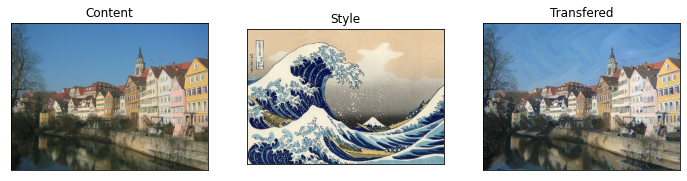

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

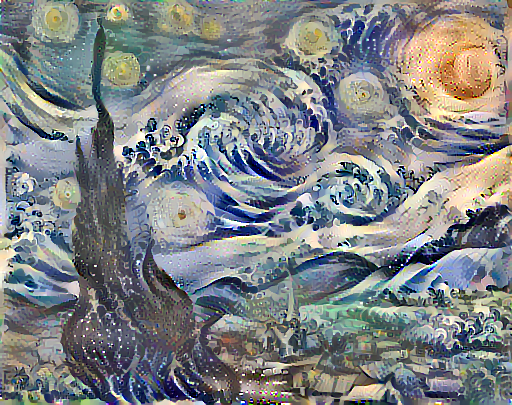

훈련 스텝: 1000
전체 소요 시간: 135.0


In [ ]:
params4 = {
    ## "별이 빛나는 밤에" : 고흐
    'content_path' : '/content/drive/MyDrive/styles/starry_night.jpg',
    ## "카나가와 해변의 높은 파도 아래" : 호쿠사이 (우키요에)
    'style_path' : '/content/drive/MyDrive/styles/The_Great_Wave_off_Kanagawa.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params4)

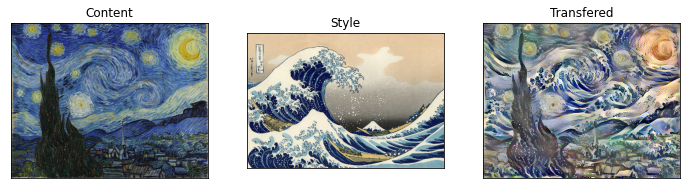

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

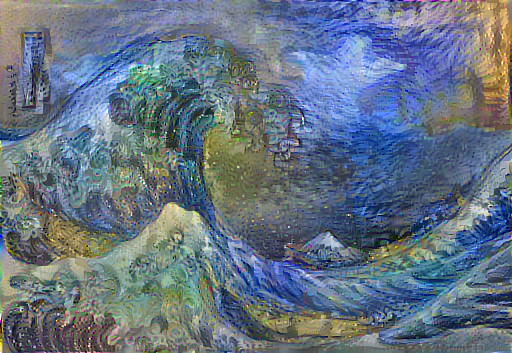

훈련 스텝: 1000
전체 소요 시간: 119.0


In [ ]:
params5 = {
    ## "카나가와 해변의 높은 파도 아래" : 호쿠사이 (우키요에)
    'content_path' : '/content/drive/MyDrive/styles/The_Great_Wave_off_Kanagawa.jpg',
    ## "별이 빛나는 밤에" : 고흐
    'style_path' : '/content/drive/MyDrive/styles/starry_night.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params5)

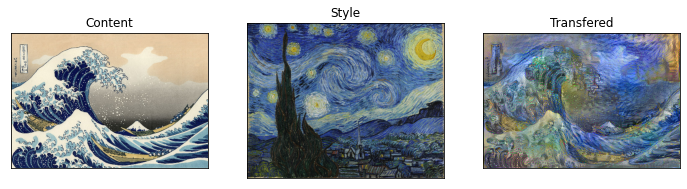

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

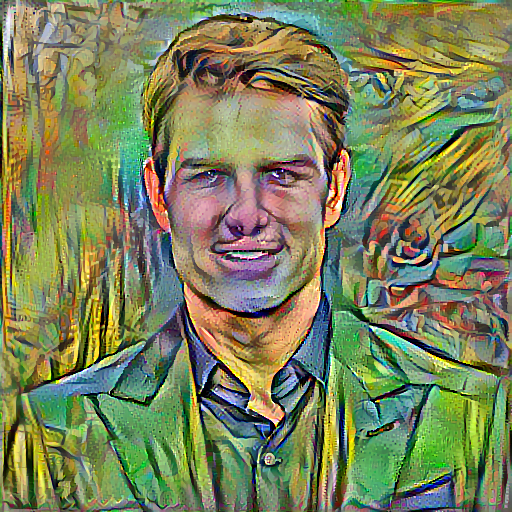

훈련 스텝: 1000
전체 소요 시간: 161.2


In [ ]:
params6 = {
    ## 톰크루즈
    'content_path' : '/content/drive/MyDrive/styles/tomCruise.jpg',
    ## "뮤즈" : 피카소
    'style_path' : '/content/drive/MyDrive/styles/muse.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params6)

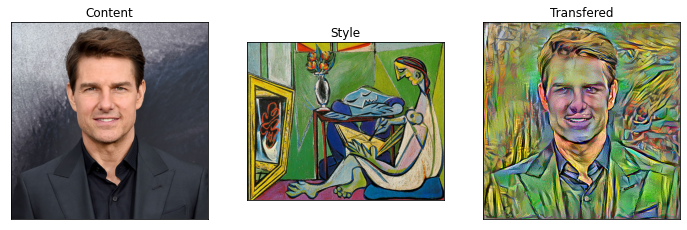

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)

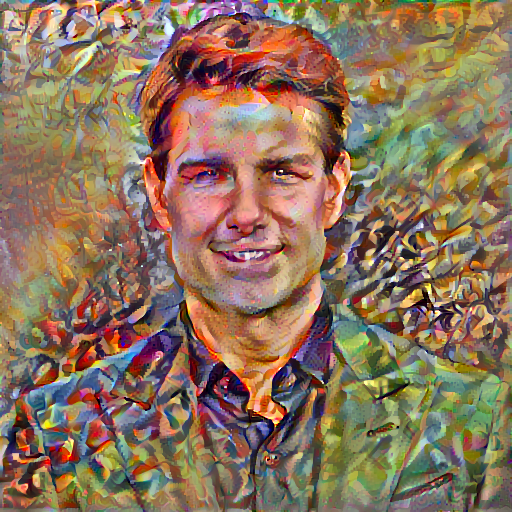

훈련 스텝: 1000
전체 소요 시간: 161.2


In [ ]:
params7 = {
    ## 톰크루즈
    'content_path' : '/content/drive/MyDrive/styles/tomCruise.jpg',
    ## "composition vii", 칸딘스키
    'style_path' : '/content/drive/MyDrive/styles/composition_vii.jpg', 
    'content_layers_no' : 18,
    'style_layers_no' : (1, 4, 7, 12, 17),
    
}

content_image, style_image, transfered_image = myTransfer(**params7)

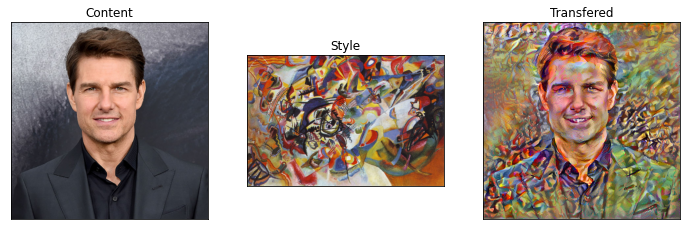

In [ ]:
images = [content_image, style_image, transfered_image] 
imshow(images)